In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import plot_acf
from matplotlib.pyplot import figure

In [4]:
def visualize_prediction(confidence, first_f, last_f, no_features, name_time_column, dataframe, title, location_line, line=False):
    fig, axes = plt.subplots(2, 2, figsize=(15,15), dpi=200)
    ax = axes.ravel()
    columns = dataframe.columns
    plt.subplots_adjust(hspace=0.6, wspace=0.4)
    for i in range(first_f,last_f):
        sns.scatterplot(data=dataframe, 
                        x=name_time_column, 
                        y=columns[i], 
                        ax=ax[i-first_f], 
                        label="target", 
                        palette="Greys")
        sns.lineplot(data=dataframe, 
                     x=name_time_column, 
                     y=columns[i+no_features], 
                     ax=ax[i-first_f], 
                     label="predicted", 
                     palette="Blues")
        ax[i-first_f].fill_between(dataframe[i+no_features].values - confidence * dataframe[i+2*no_features].values, 
                              dataframe[i+no_features].values + confidence * dataframe[i+2*no_features].values, 
                              alpha=0.2, 
                              color='blue')
        if line:
            ax[i-first_f].axvline(location_line, 0,2, color="r", linestyle ="--", linewidth=1, label="train-validation")
        ax[i-first_f].set(xlabel='up time', ylabel='sensor value')
        ax[i-first_f].set(title=columns[i])
        plt.setp(ax[i-first_f].get_xticklabels(), rotation=45) 
    fig.suptitle(title)
    plt.subplots_adjust(wspace=0.3, hspace=0.3)

In [16]:
def visualise_mle_prediction(dataframe, no_features, first_feature, last_feature, location_line, line=False):
    fig, axes = plt.subplots(no_features, 1, figsize=(30,40))
    ax = axes.ravel()
    columns = dataframe.columns
    t = dataframe.iloc[:,0]
    for i in range(first_feature, last_feature):
        # Values for drawing lower and upper bound
        target = dataframe.iloc[:,i].values
        mu = dataframe.iloc[:,i+no_features].values
        sigma = dataframe.iloc[:,i+2*no_features].values
        lower_bound = mu - 2*sigma
        upper_bound = mu + 2* sigma
        
        # Values about appearance of anomaly 
        palette = []
        anomaly_label = dataframe.iloc[:, i+4*no_features+1].values
        if 0 in anomaly_label and 1 not in anomaly_label:
            palette = ["blue"]
        elif 1 in anomaly_label and 0 not in anomaly_label:
            palette = ["red"]
        elif 0 in anomaly_label and 1 in anomaly_label:
            palette = ["blue","red"]

        sns.lineplot(data=dataframe, 
                     x=t, 
                     y=columns[i+no_features], 
                     ax=ax[i-first_feature], 
                     color="black")
        ax[i-first_feature].fill_between(t, lower_bound, upper_bound, color="grey", alpha=0.5)
        if line:
            ax[i-first_feature].axvline(location_line, 0,2, color="r", linestyle ="--", linewidth=1)
        
        sns.scatterplot(data=dataframe, 
                        x=t, 
                        y=columns[i],
                        ax=ax[i-first_feature], 
                        hue=columns[i+4*no_features+1],
                        palette=palette
                        )   

# Visualisation of Prediction - Artifical Signal
## Phase 1 - no error

In [22]:
artifical_data = pd.read_csv("../../files/prediction/MLE/cpps_degradation.csv", sep=";")
artifical_data = artifical_data.iloc[:20981,:]

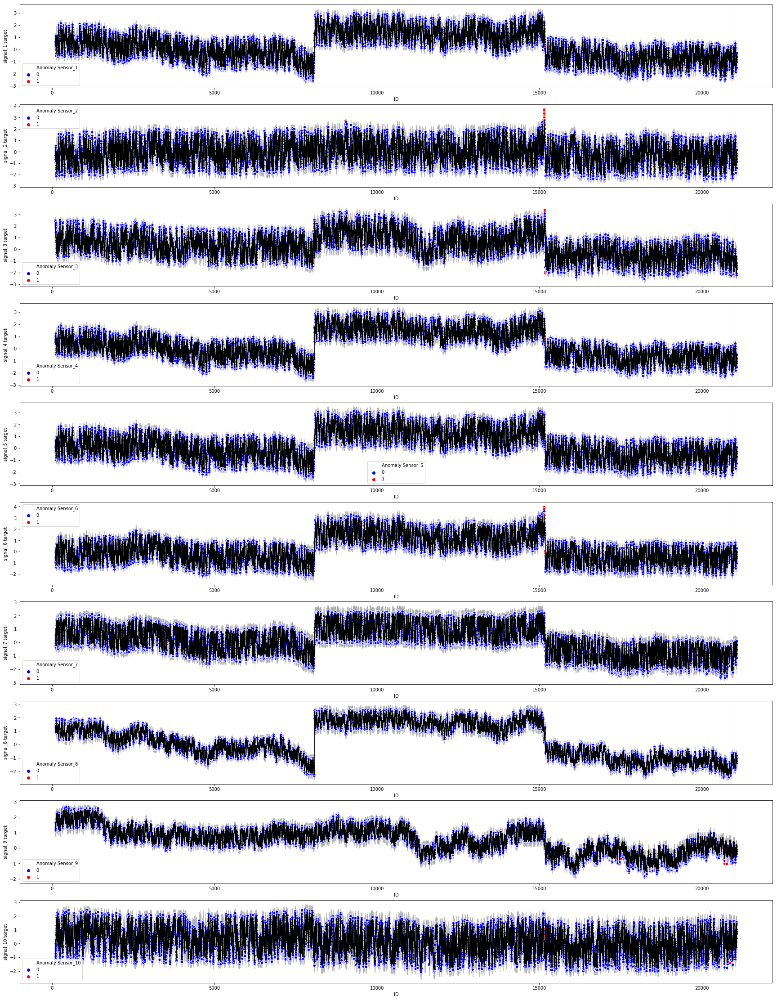

In [21]:
visualise_mle_prediction(dataframe = artifical_data,
                         no_features=10, 
                         first_feature=1, 
                         last_feature=11,
                         line = True,
                         location_line = 20981
                        )
plt.show()

### Ratio Anomaly / No Anomaly 

In [23]:
for i in range(1,11):
    labels = artifical_data.iloc[:, i+4*10+1]
    print("Sensor No. {}".format(i))
    print("No. normal behaviour: {}".format(labels.value_counts()[0]))
    print("No. anomalous behaviour: {}".format(labels.value_counts()[1]))
    print("- -"*10)

Sensor No. 1
No. normal behaviour: 20976
No. anomalous behaviour: 5
- -- -- -- -- -- -- -- -- -- -
Sensor No. 2
No. normal behaviour: 20956
No. anomalous behaviour: 25
- -- -- -- -- -- -- -- -- -- -
Sensor No. 3
No. normal behaviour: 20963
No. anomalous behaviour: 18
- -- -- -- -- -- -- -- -- -- -
Sensor No. 4
No. normal behaviour: 20973
No. anomalous behaviour: 8
- -- -- -- -- -- -- -- -- -- -
Sensor No. 5
No. normal behaviour: 20978
No. anomalous behaviour: 3
- -- -- -- -- -- -- -- -- -- -
Sensor No. 6
No. normal behaviour: 20954
No. anomalous behaviour: 27
- -- -- -- -- -- -- -- -- -- -
Sensor No. 7
No. normal behaviour: 20949
No. anomalous behaviour: 32
- -- -- -- -- -- -- -- -- -- -
Sensor No. 8
No. normal behaviour: 20977
No. anomalous behaviour: 4
- -- -- -- -- -- -- -- -- -- -
Sensor No. 9
No. normal behaviour: 20768
No. anomalous behaviour: 213
- -- -- -- -- -- -- -- -- -- -
Sensor No. 10
No. normal behaviour: 20970
No. anomalous behaviour: 11
- -- -- -- -- -- -- -- -- -- -


## Transistion from Phase 1 to Phase 2

In [24]:
artifical_data = pd.read_csv("../../files/prediction/MLE/cpps_degradation.csv", sep=";")
artifical_data = artifical_data.iloc[20581:36485,:]

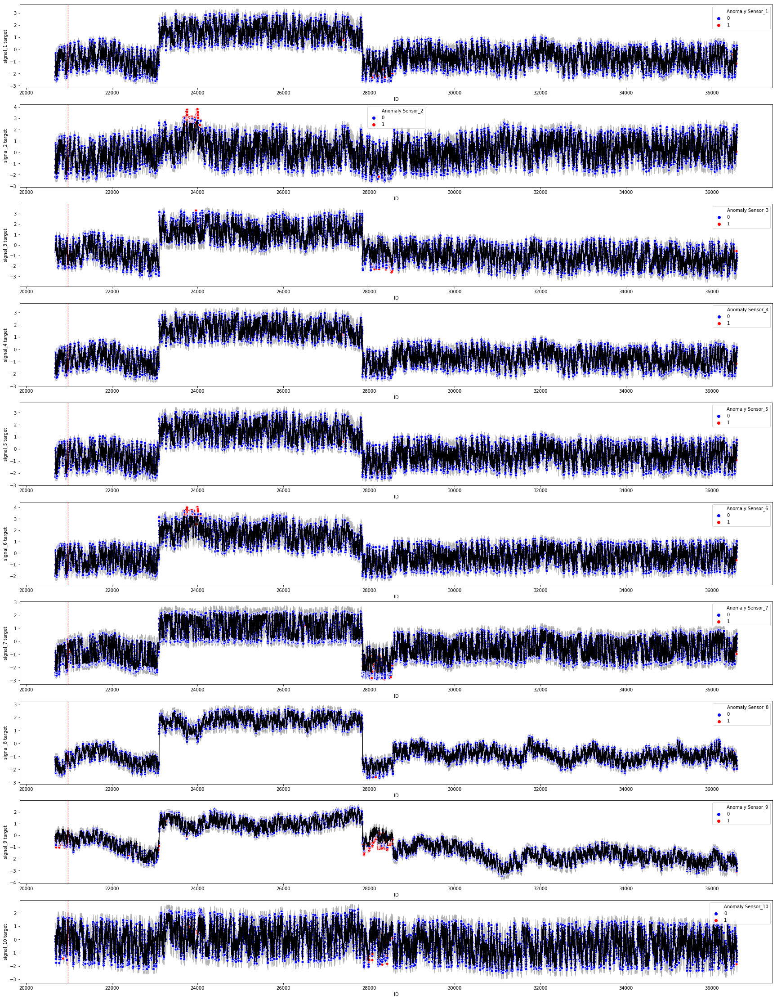

In [19]:
visualise_mle_prediction(dataframe = artifical_data,
                         no_features=10, 
                         first_feature=1, 
                         last_feature=11,
                         line = True,
                         location_line = 20981
                        )
plt.show()

In [34]:
artifical_data = pd.read_csv("../../files/prediction/MLE/cpps_degradation.csv", sep=";")
artifical_data = artifical_data.iloc[35000:36985,:]

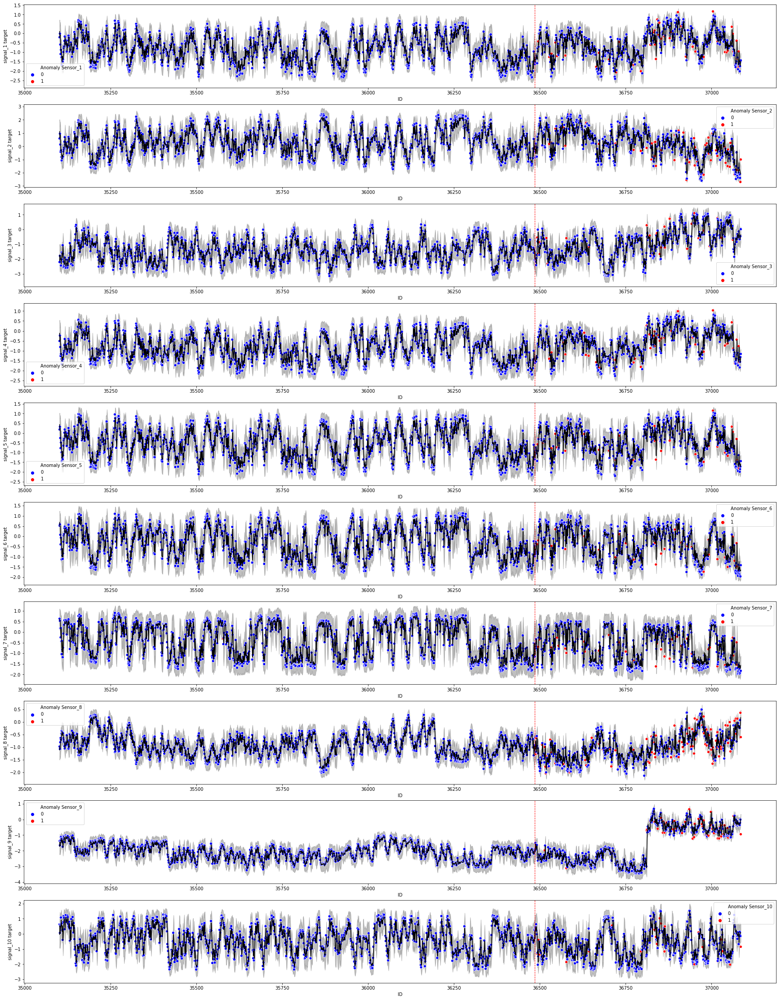

In [35]:
visualise_mle_prediction(dataframe = artifical_data,
                         no_features=10, 
                         first_feature=1, 
                         last_feature=11,
                         line = True,
                         location_line = 36485
                        )
plt.show()

In [25]:
for i in range(1,11):
    labels = artifical_data.iloc[:, i+4*10+1]
    print("Sensor No. {}".format(i))
    print("No. normal behaviour: {}".format(labels.value_counts()[0]))
    print("No. anomalous behaviour: {}".format(labels.value_counts()[1]))
    print("- -"*10)

Sensor No. 1
No. normal behaviour: 15864
No. anomalous behaviour: 40
- -- -- -- -- -- -- -- -- -- -
Sensor No. 2
No. normal behaviour: 15783
No. anomalous behaviour: 121
- -- -- -- -- -- -- -- -- -- -
Sensor No. 3
No. normal behaviour: 15819
No. anomalous behaviour: 85
- -- -- -- -- -- -- -- -- -- -
Sensor No. 4
No. normal behaviour: 15888
No. anomalous behaviour: 16
- -- -- -- -- -- -- -- -- -- -
Sensor No. 5
No. normal behaviour: 15881
No. anomalous behaviour: 23
- -- -- -- -- -- -- -- -- -- -
Sensor No. 6
No. normal behaviour: 15795
No. anomalous behaviour: 109
- -- -- -- -- -- -- -- -- -- -
Sensor No. 7
No. normal behaviour: 15798
No. anomalous behaviour: 106
- -- -- -- -- -- -- -- -- -- -
Sensor No. 8
No. normal behaviour: 15881
No. anomalous behaviour: 23
- -- -- -- -- -- -- -- -- -- -
Sensor No. 9
No. normal behaviour: 15436
No. anomalous behaviour: 468
- -- -- -- -- -- -- -- -- -- -
Sensor No. 10
No. normal behaviour: 15824
No. anomalous behaviour: 80
- -- -- -- -- -- -- -- -- 

## Transistion from Phase 2 to Phase 3

In [28]:
artifical_data = pd.read_csv("../../files/prediction/MLE/cpps_degradation.csv", sep=";")
artifical_data = artifical_data.iloc[36085:,:]

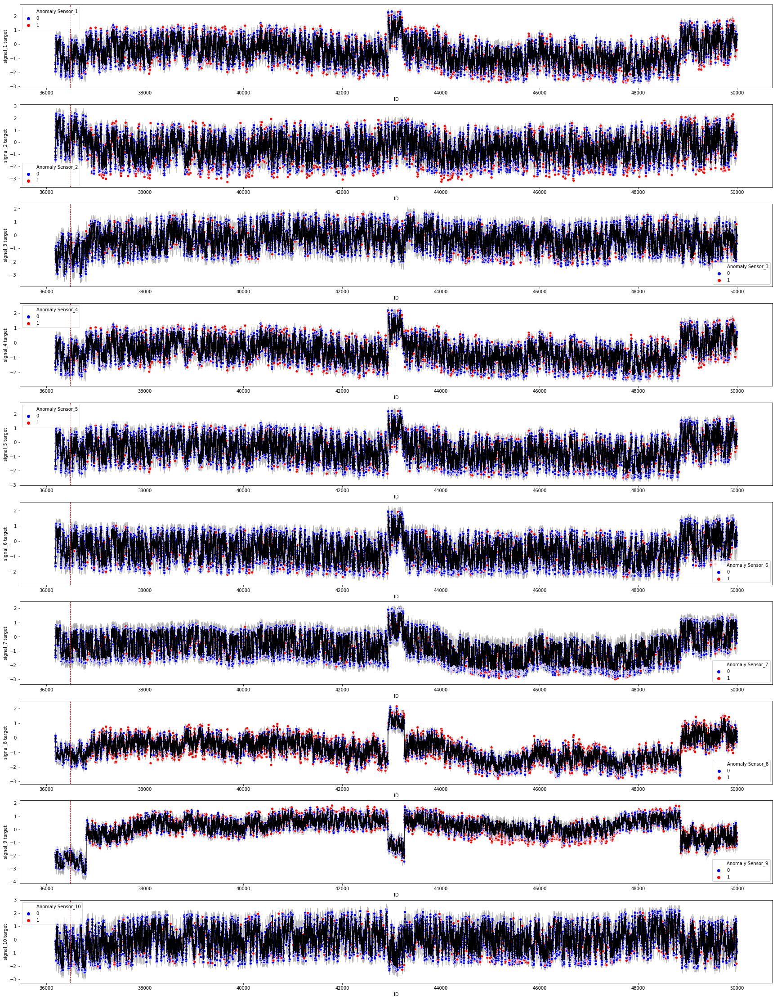

In [29]:
visualise_mle_prediction(dataframe = artifical_data,
                         no_features=10, 
                         first_feature=1, 
                         last_feature=11,
                         line = True,
                         location_line = 36485
                        )
plt.show()

In [30]:
for i in range(1,11):
    labels = artifical_data.iloc[:, i+4*10+1]
    print("Sensor No. {}".format(i))
    print("No. normal behaviour: {}".format(labels.value_counts()[0]))
    print("No. anomalous behaviour: {}".format(labels.value_counts()[1]))
    print("- -"*10)

Sensor No. 1
No. normal behaviour: 11933
No. anomalous behaviour: 1882
- -- -- -- -- -- -- -- -- -- -
Sensor No. 2
No. normal behaviour: 11796
No. anomalous behaviour: 2019
- -- -- -- -- -- -- -- -- -- -
Sensor No. 3
No. normal behaviour: 12608
No. anomalous behaviour: 1207
- -- -- -- -- -- -- -- -- -- -
Sensor No. 4
No. normal behaviour: 11956
No. anomalous behaviour: 1859
- -- -- -- -- -- -- -- -- -- -
Sensor No. 5
No. normal behaviour: 12415
No. anomalous behaviour: 1400
- -- -- -- -- -- -- -- -- -- -
Sensor No. 6
No. normal behaviour: 12583
No. anomalous behaviour: 1232
- -- -- -- -- -- -- -- -- -- -
Sensor No. 7
No. normal behaviour: 12389
No. anomalous behaviour: 1426
- -- -- -- -- -- -- -- -- -- -
Sensor No. 8
No. normal behaviour: 10450
No. anomalous behaviour: 3365
- -- -- -- -- -- -- -- -- -- -
Sensor No. 9
No. normal behaviour: 10972
No. anomalous behaviour: 2843
- -- -- -- -- -- -- -- -- -- -
Sensor No. 10
No. normal behaviour: 12502
No. anomalous behaviour: 1313
- -- -- --